In [5]:
import os
import random
import argparse
import sys
sys.path.append(os.path.abspath('..'))
from Utility.generalCV import *

import torch
import os
import cv2
import numpy as np
from PIL import Image
import torchvision.transforms.functional as F
from torchvision.transforms.functional import InterpolationMode

set the random seed

In [6]:
def set_seed(seed_value=42):
    """Set seed for reproducibility."""
    random.seed(seed_value)  # Python random module
    np.random.seed(seed_value)  # Numpy library
    torch.manual_seed(seed_value)  # Torch

    # if using CUDA
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value)  # if using multi-GPU
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

set_seed()


In [7]:
def main_pure_image(example_image_folder):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # load the model train on specimen: [1,3,4,5,6,9,10,11,12,13,14]
    model_path = "models/train_on_1_3_4_5_6_9_10_11_12_13_14/epoch_100.pth"
    model = torch.load(model_path, map_location=device) 
    model = model.to(device)
    for file in os.listdir(example_image_folder):
        img_file = os.path.join(example_image_folder, file)
        img_cv2 = cv2.imread(img_file, cv2.IMREAD_GRAYSCALE)
        img = Image.open(img_file).convert('L')
        image = F.to_tensor(img)
        image = F.resize(image, [256, 256], interpolation=InterpolationMode.BILINEAR)
        images = F.normalize(image, mean=0.17475835978984833, std=0.16475939750671387).unsqueeze(0)
        outputs = model(images.to(device))
        outputs = torch.sigmoid(outputs)

        image = images[0][0]
        pred_labels = (outputs > 0.5)
        pred_label = 255 * pred_labels[0][0].cpu().numpy().astype(np.uint8)

        img_cv2_resized = cv2.resize(img_cv2, (256, 256))

        # Merge images
        merged_img = merge_images_horizontally([
            img_cv2_resized,
            overlap_image_with_label(img_cv2_resized, pred_label)
        ])

        # Display in Jupyter notebook
        plt.figure(figsize=(10, 5))
        if len(merged_img.shape) == 2:  # Grayscale
            plt.imshow(merged_img, cmap='gray')
        else:
            plt.imshow(cv2.cvtColor(merged_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

Using device: cuda


C:\Users\wulu\AppData\Local\Temp\ipykernel_21516\3074563415.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=device)  # safer 

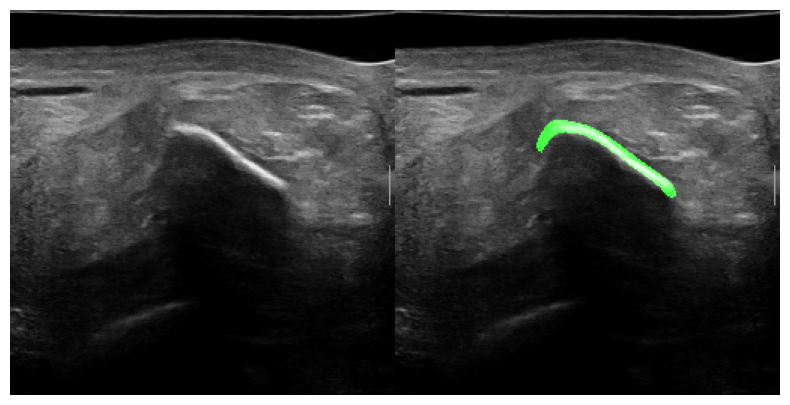

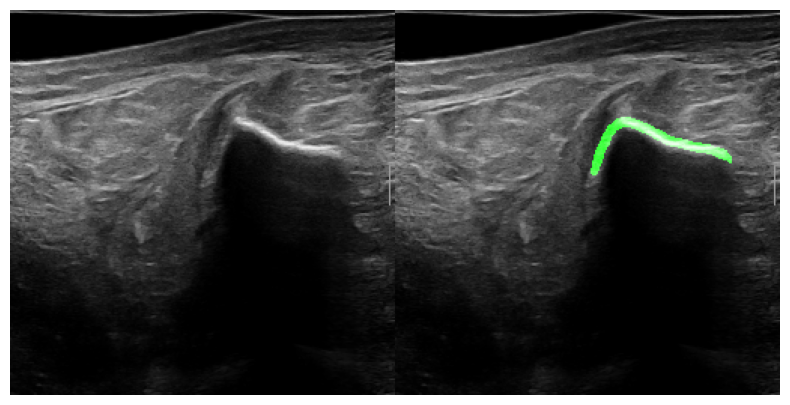

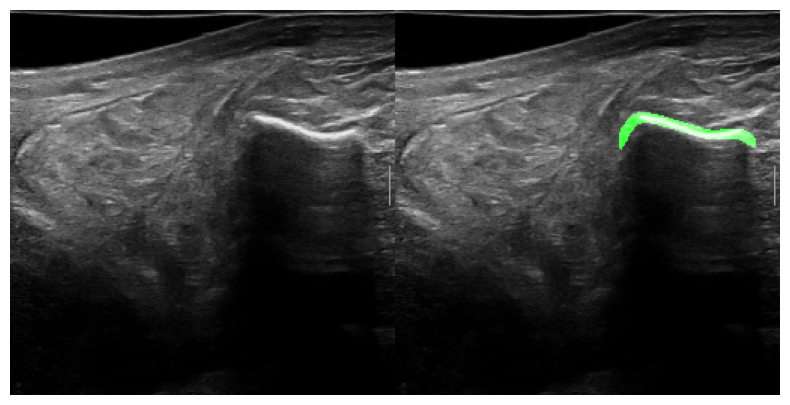

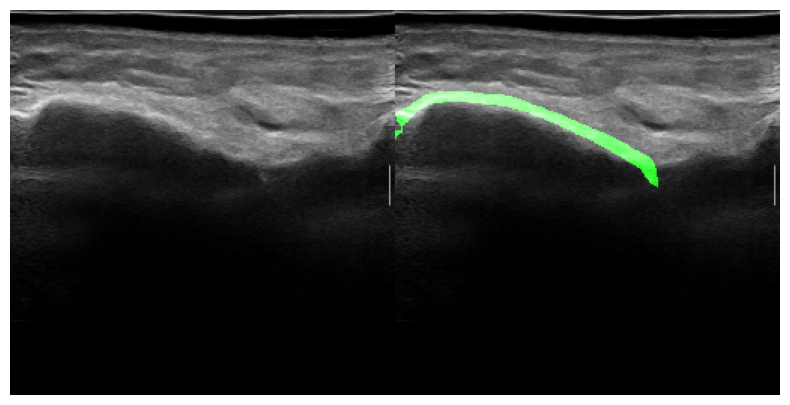

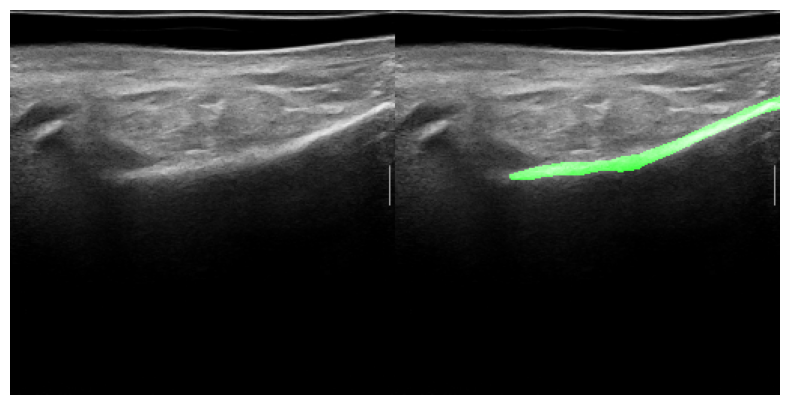

...

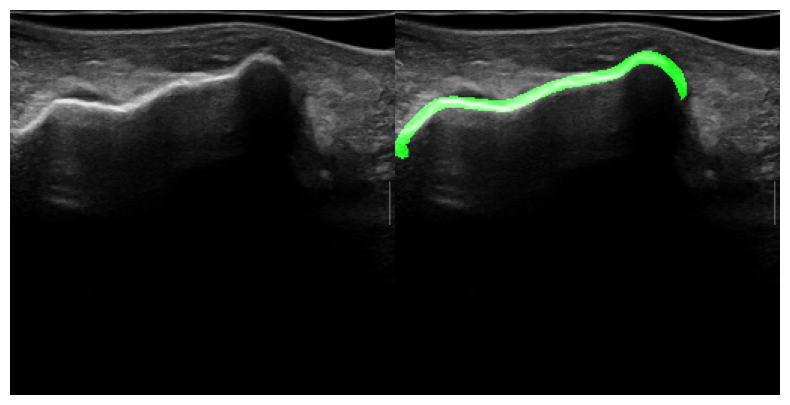

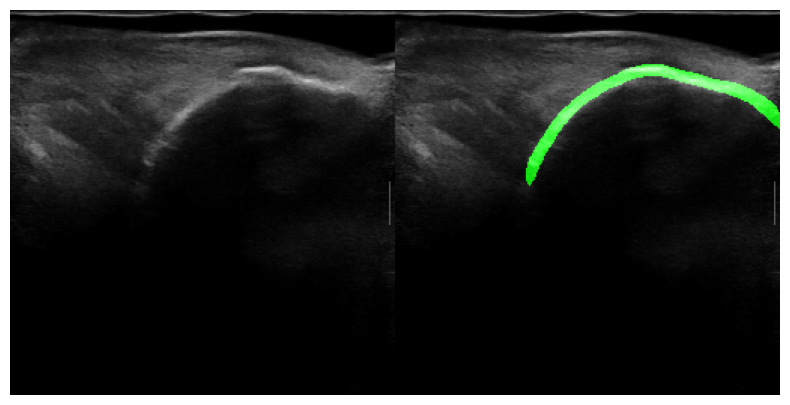

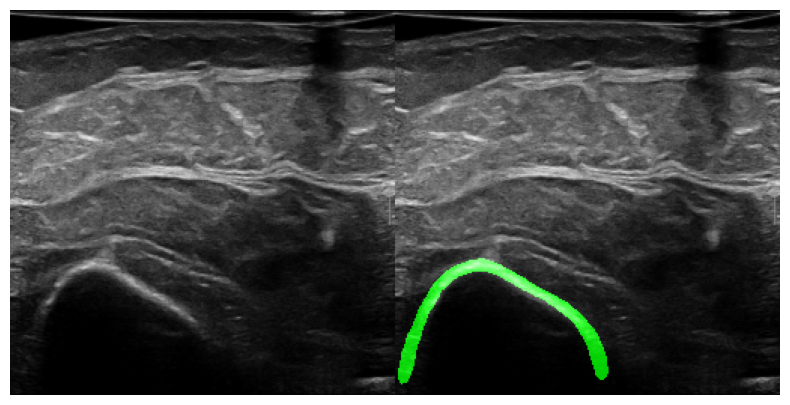

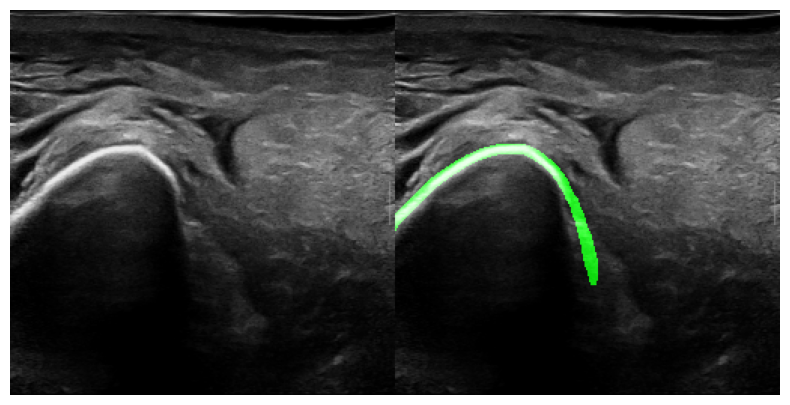

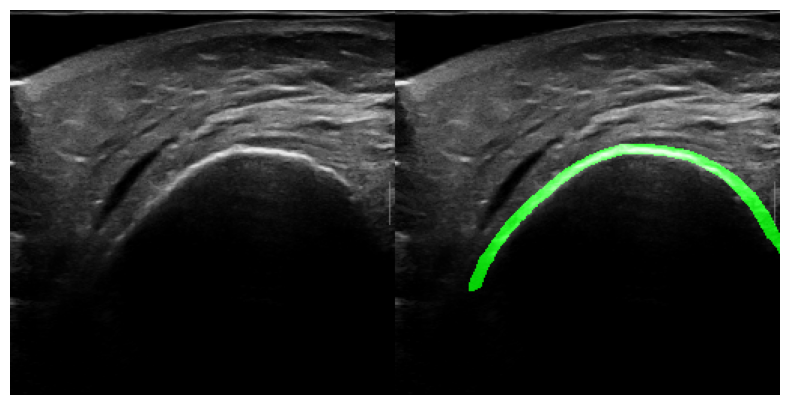

In [8]:
main_pure_image("./example_ultrasound_images")
